# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import matplotlib.pyplot as plt                        # visualize with plots
%matplotlib inline
import seaborn as sns
plt.style.use('seaborn-white')
import plotly.express as px 
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.linear_model  import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
import warnings
warnings.filterwarnings('ignore')

C:\Users\yokau\AppData\Local\Temp\ipykernel_16388\2123972148.py:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-white')


### Dataset Loading

In [2]:
# Load Dataset

In [3]:
sheet_df_dictonary = pd.read_excel(r'C:\\Users\\yokau\\Downloads\\Round2\\Round2\\Dataset - Copy.xlsx', engine='openpyxl', sheet_name=[
    'Dataset'
], skiprows=0)


In [4]:
df = sheet_df_dictonary['Dataset']

### Dataset First View

In [5]:
# Dataset First Look

In [6]:
df

,Area,Perimeter,MajorAxisLength,DFactor1,DFactor2,DFactor3,DFactor4,DFactor5,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SE
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SE
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SE
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SE
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DE
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DE
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DE
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DE


### Dataset Rows & Columns count

In [7]:
# Dataset Rows & Columns count

In [8]:
df.shape

(13611, 17)

In [9]:
# there are 13611 rows and 17 columns

### Dataset Information

In [10]:
# Dataset Info

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   DFactor1         13611 non-null  float64
 4   DFactor2         13611 non-null  float64
 5   DFactor3         13611 non-null  float64
 6   DFactor4         13611 non-null  int64  
 7   DFactor5         13611 non-null  float64
 8   DFactor6         13611 non-null  float64
 9   DFactor7         13611 non-null  float64
 10  DFactor8         13611 non-null  float64
 11  DFactor9         13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [12]:
#there are no null values in any columns most columns are float type and 2 columns integers except the target variable its object type

#### Duplicate Values

In [13]:
# Dataset Duplicate Value Count

In [14]:
len(df[df.duplicated()])

68

In [15]:
# there are 68 duplicate values

In [16]:
#dropping duplicate values

df = df.drop_duplicates()

#### Missing Values/Null Values

In [17]:
# Missing Values/Null Values Count

In [18]:
def missing_values(df):
    mis_val=df.isnull().sum()
    mis_val_percent=round(df.isnull().mean().mul(100),2)
    mz_table=pd.concat([mis_val,mis_val_percent],axis=1)
    mz_table=mz_table.rename(
    columns={df.index.name:'col_name',0:'Missing Values',1:'% of Total Values'})
    mz_table['Data_type']=df.dtypes
    mz_table=mz_table.sort_values('% of Total Values',ascending=False)
    return mz_table.reset_index()

In [19]:
missing_values(df)

,index,Missing Values,% of Total Values,Data_type
0,Area,0,0.0,int64
1,DFactor7,0,0.0,float64
2,ShapeFactor4,0,0.0,float64
3,ShapeFactor3,0,0.0,float64
4,ShapeFactor2,0,0.0,float64
...,...,...,...,...
12,DFactor3,0,0.0,float64
13,DFactor2,0,0.0,float64
14,DFactor1,0,0.0,float64
15,MajorAxisLength,0,0.0,float64


In [20]:
# Visualizing the missing values

<Axes: >

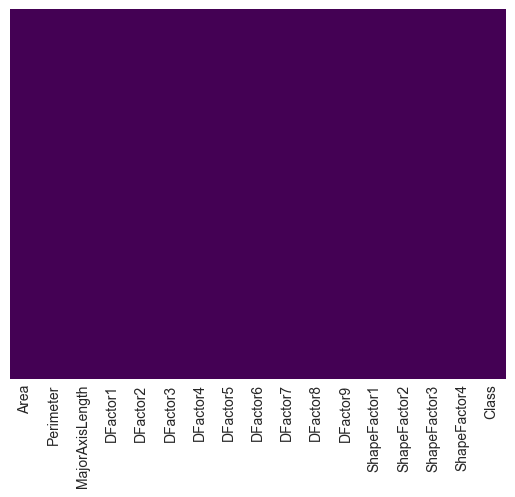

In [21]:
sns.heatmap(df.isnull(), cmap='viridis', cbar=False, yticklabels=False)

### What did you know about your dataset?

Answer Here
there are no null values 

## ***2. Understanding Your Variables***

In [22]:
# Dataset Columns

In [23]:
# Dataset Describe

In [24]:
df.describe()

,Area,Perimeter,MajorAxisLength,DFactor1,DFactor2,DFactor3,DFactor4,DFactor5,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000,13543.000000
mean,53048.460385,854.993406,319.895602,202.365321,1.581075,0.750315,53767.986709,253.034094,0.749829,0.987152,0.873671,0.800352,0.006561,0.001719,0.644341,0.995078
std,29392.438324,214.722684,85.809260,45.051632,0.245245,0.091858,29844.248525,59.307709,0.048939,0.004650,0.059393,0.061464,0.001130,0.000595,0.098653,0.004347
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36282.500000,703.230000,253.086806,175.886357,1.430662,0.715144,36673.000000,214.933277,0.718735,0.985678,0.833410,0.763228,0.005893,0.001158,0.582517,0.993720
50%,44580.000000,793.896000,296.404589,192.491117,1.549860,0.763997,45122.000000,238.245711,0.759903,0.988288,0.883490,0.801514,0.006643,0.001700,0.642424,0.996393
75%,61382.000000,977.146500,376.312489,217.245403,1.703916,0.809671,62360.000000,279.560351,0.786849,0.990019,0.917031,0.834470,0.007270,0.002173,0.696341,0.997891
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


### Variables Description 

Answer Here

there are many outliers in area,Perimeter,DFactor1,DFactor4,DFactor5 columns as there is huge difference between 75% and max


## 3. ***Data Wrangling***

### Data Wrangling Code

In [25]:
# Write your code to make your dataset analysis ready.

### What all manipulations have you done and insights you found?

Answer Here.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

In [26]:
# Chart - 1 visualization code

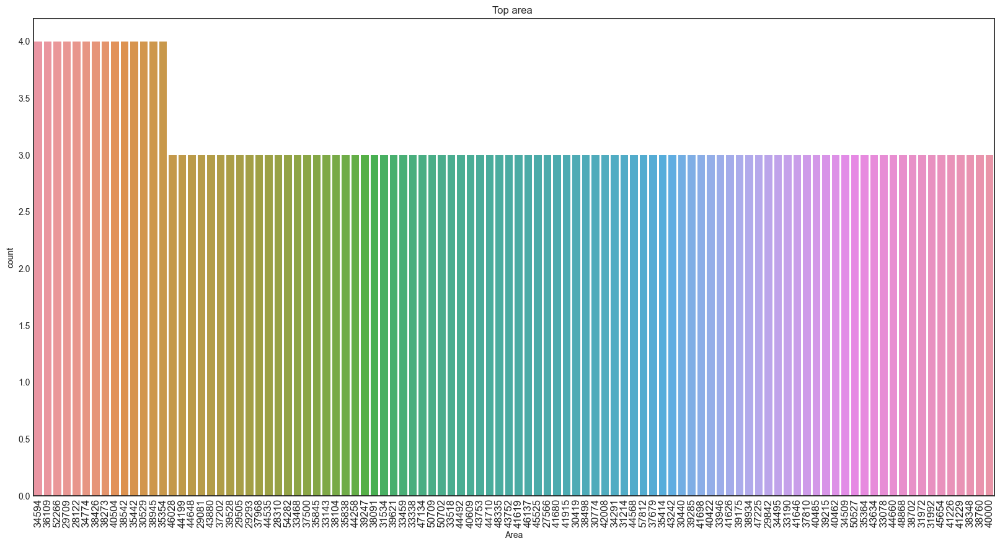

In [27]:
plt.figure(figsize = (20, 10))
sns.countplot(x = 'Area', data = df,
             order = df['Area'].value_counts().iloc[:100].index)
plt.title("Top area ")
plt.xticks(fontsize = 12)
plt.xticks(rotation=90)
plt.show()

##### 2. What is/are the insight(s) found from the chart?

Answer Here

only 14 are having the highest area

#### Chart - 2

In [28]:
# Chart - 2 visualization code

# dividing into 2 category numerical and category

In [29]:
numeric_features = [feature for feature in df.columns if df[feature].dtype != 'O']
categorical_features = [feature for feature in df.columns if df[feature].dtype == 'O']

# print columns
print('We have {} numerical features : {}'.format(len(numeric_features), numeric_features))
print('\nWe have {} categorical features : {}'.format(len(categorical_features), categorical_features))

We have 16 numerical features : ['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2', 'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8', 'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3', 'ShapeFactor4']

We have 1 categorical features : ['Class']


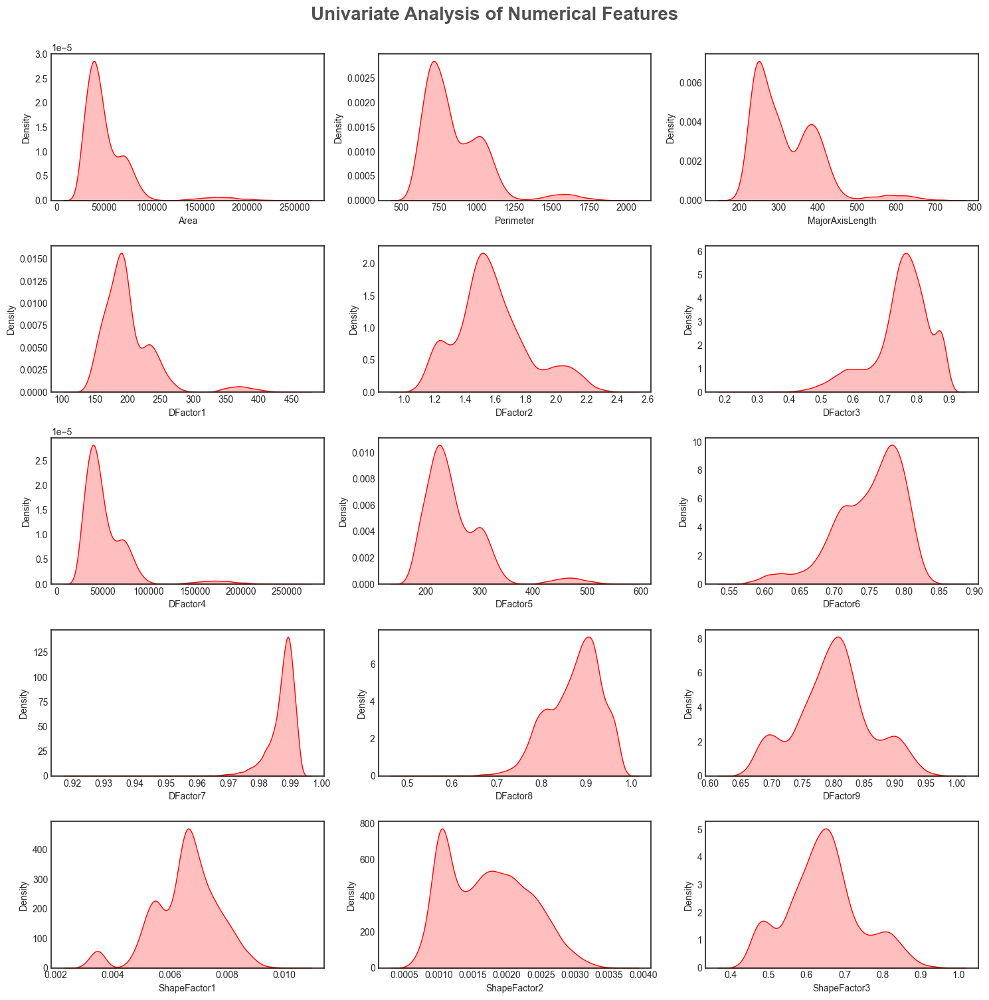

In [30]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


# Convert the scalar values in the DataFrame to a NumPy array
array = np.array(df)

# Select the first 15 columns of the DataFrame
df_subset = df.iloc[:, :15]

# Plot the univariate analysis of the numeric features
plt.figure(figsize=(15, 15))
plt.suptitle('Univariate Analysis of Numerical Features', fontsize=20, fontweight='bold', alpha=0.8, y=1.)

for i in range(0, len(df_subset.columns)):
    plt.subplot(5, 3, i+1)
    sns.kdeplot(x=array[:, i], shade=True, color='r')
    plt.xlabel(df_subset.columns[i])
    plt.tight_layout()

plt.show()


##### 2. What is/are the insight(s) found from the chart?

Answer Here
ShapeFactor2,ShapeFactor3,ShapeFactor1,DFactor2,DFactor9 these columns are almost normally distributed

Answer Here
Area,Perimeter,MajorAxisLength,DFactor1,DFactor5 these columns are left skewwed meaning has many outliers

#### Chart - 3

In [31]:
# Chart - 3 visualization code

In [32]:
print(df['Class'].nunique())

7


In [33]:
df['Class'].value_counts()

Class
DE    3546
SI    2636
SE    2027
HO    1860
CA    1630
BA    1322
BO     522
Name: count, dtype: int64

##### 2. What is/are the insight(s) found from the chart?

Answer Here

there are 7 class in target variable

#### Chart - 4

In [34]:
# Chart - 4 visualization code

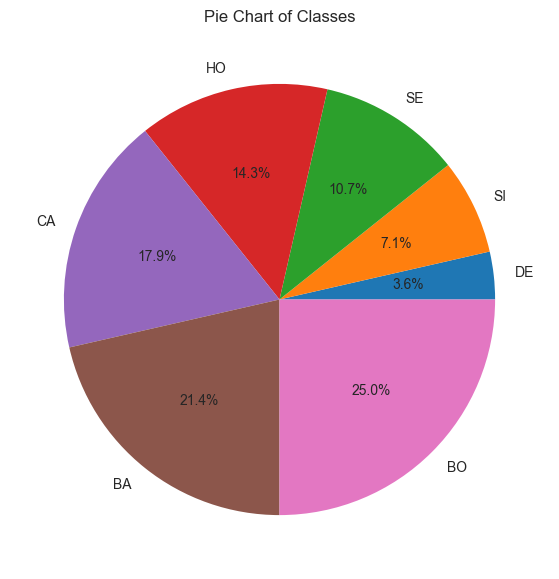

In [35]:
import matplotlib.pyplot as plt

classlabels=['DE', 'SI', 'SE', 'HO', 'CA', 'BA', 'BO']

# Create a list of percentages
percentages = [10, 20, 30, 40, 50, 60, 70]

# Create a pie chart
plt.figure(figsize=(12, 7))
plt.pie(percentages, labels=classlabels, autopct='%1.1f%%')
plt.title("Pie Chart of Classes")
plt.show()


##### 2. What is/are the insight(s) found from the chart?

Answer Here

BO HAS most following by BA,CA least is DE with 3.6 %

In [36]:
# Chart - 6 visualization code

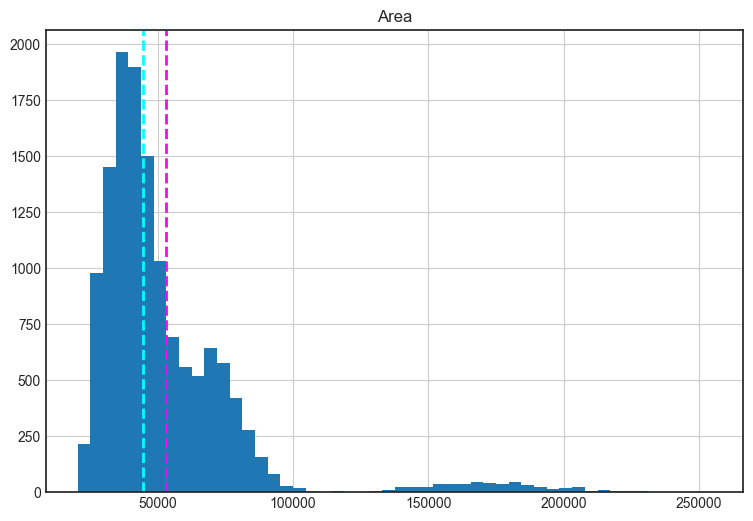

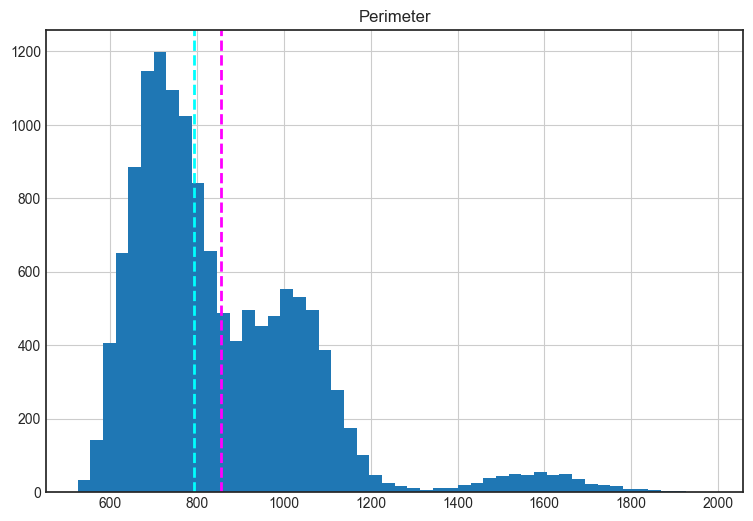

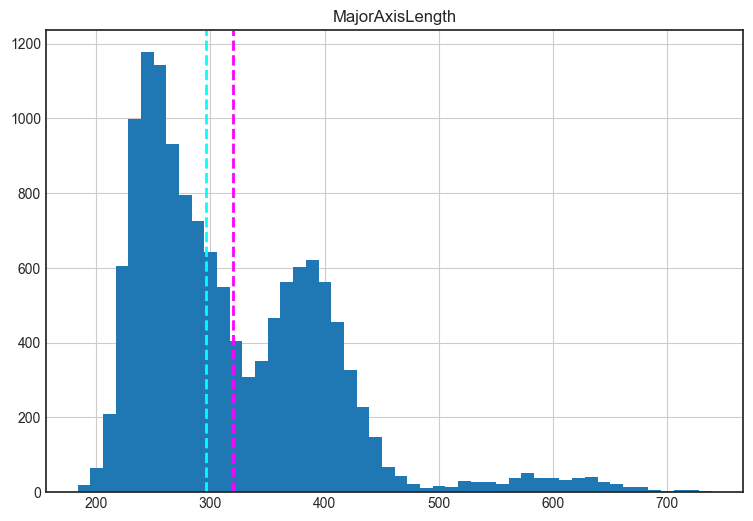

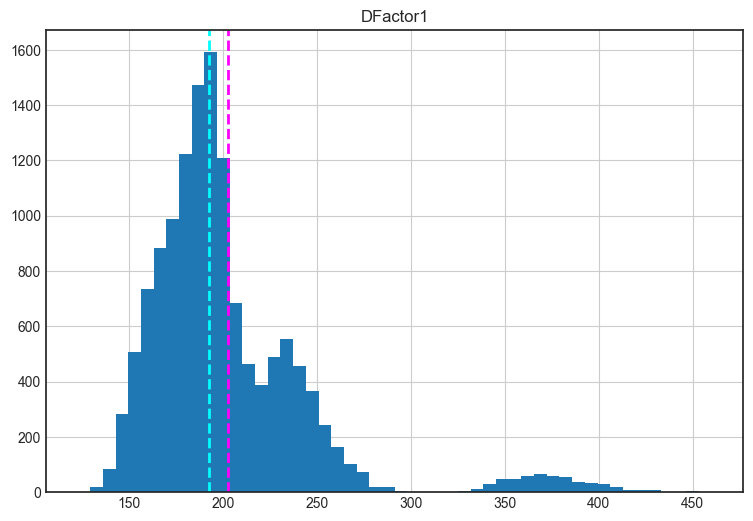

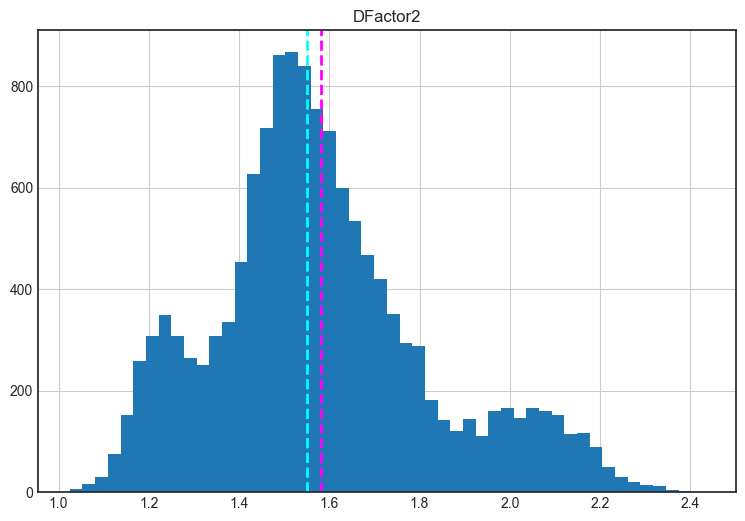

...

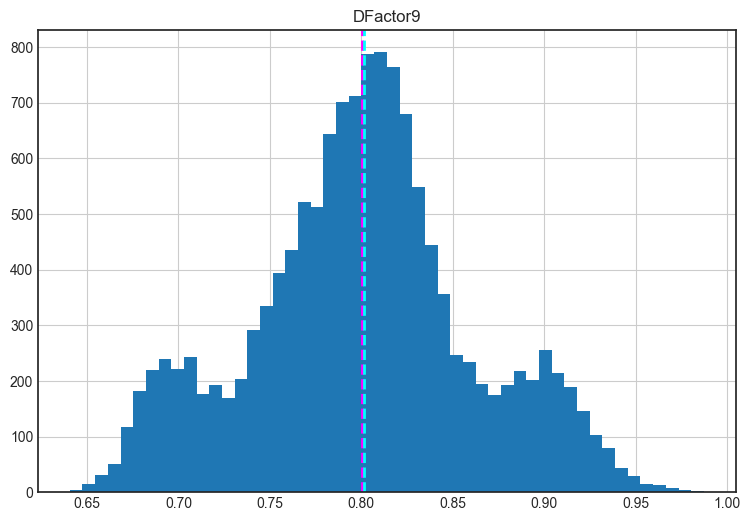

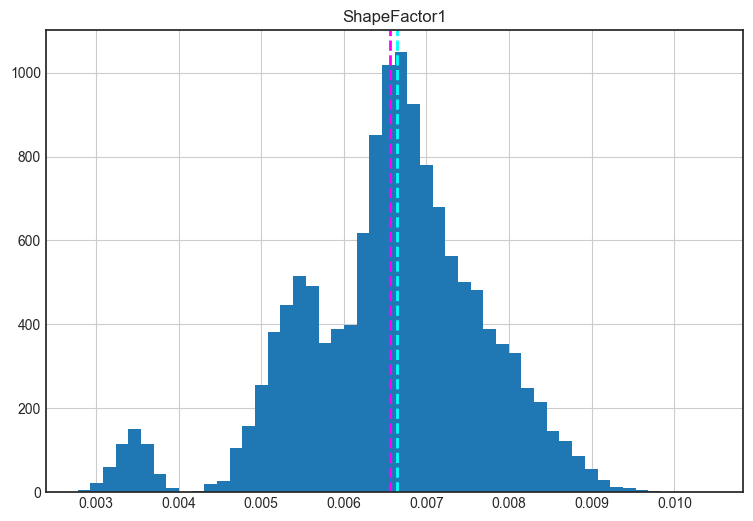

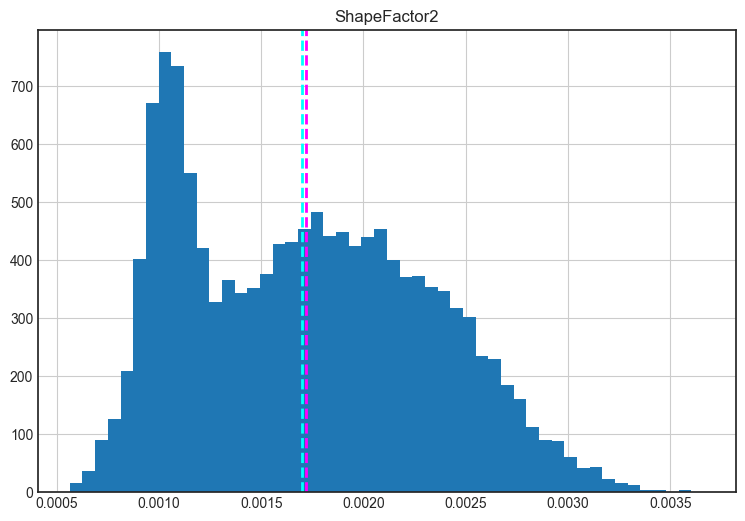

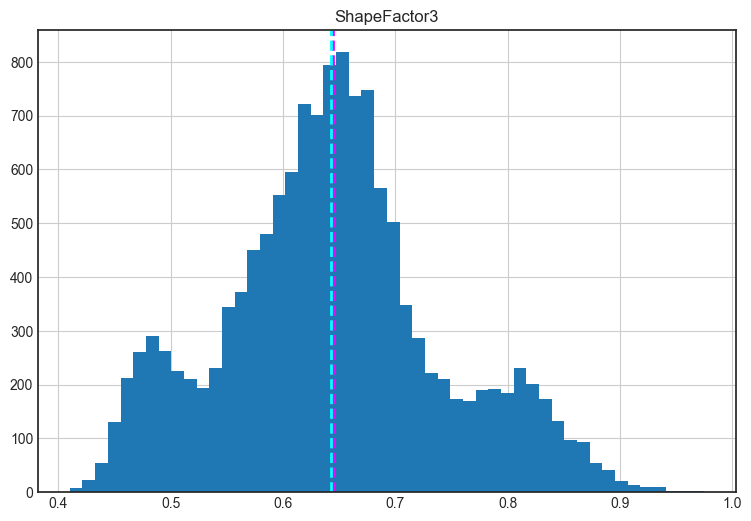

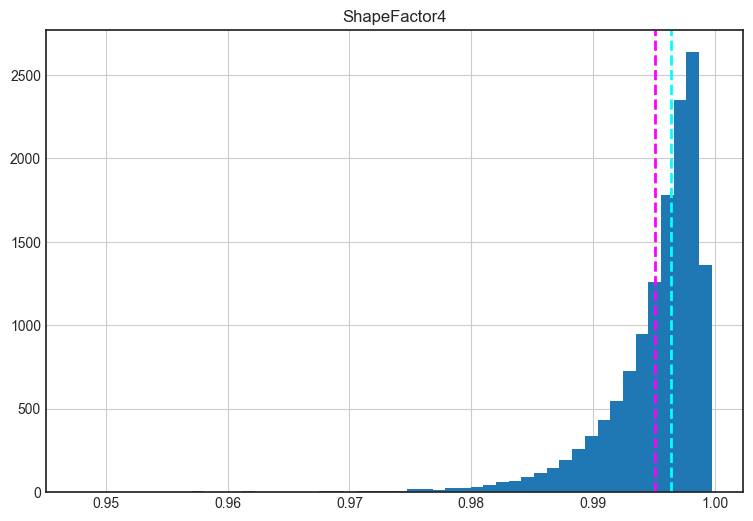

In [37]:
# Check for skewness in the dataset
numeric_features = df.describe().columns
for col in numeric_features:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    feature = df[col]
    feature.hist(bins=50, ax = ax)
    ax.axvline(feature.mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)    
    ax.set_title(col)
plt.show()

##### 2. What is/are the insight(s) found from the chart?

Answer Here

most columns are left skewwed meaning mostly outliers are there

In [38]:
# Chart - 8 visualization code

<Axes: xlabel='Class', ylabel='Count'>

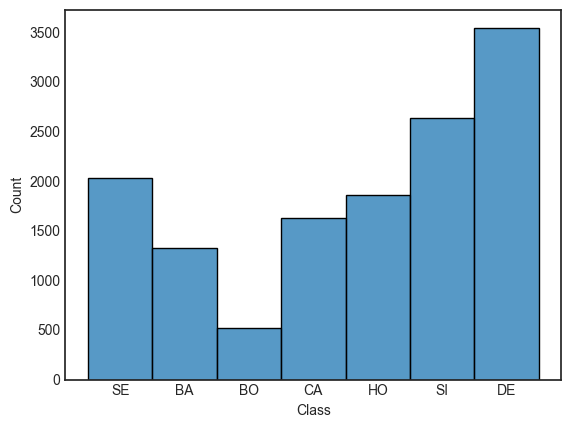

In [39]:
sns.histplot(df['Class'])

##### 2. What is/are the insight(s) found from the chart?

Answer Here

there are 7 class DE has most numbers and its right skewwed

Answer Here

#### Chart - 14 - Correlation Heatmap

In [40]:
# Correlation Heatmap visualization code

In [41]:
df

,Area,Perimeter,MajorAxisLength,DFactor1,DFactor2,DFactor3,DFactor4,DFactor5,DFactor6,DFactor7,DFactor8,DFactor9,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SE
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SE
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SE
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SE
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DE
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DE
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DE
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DE


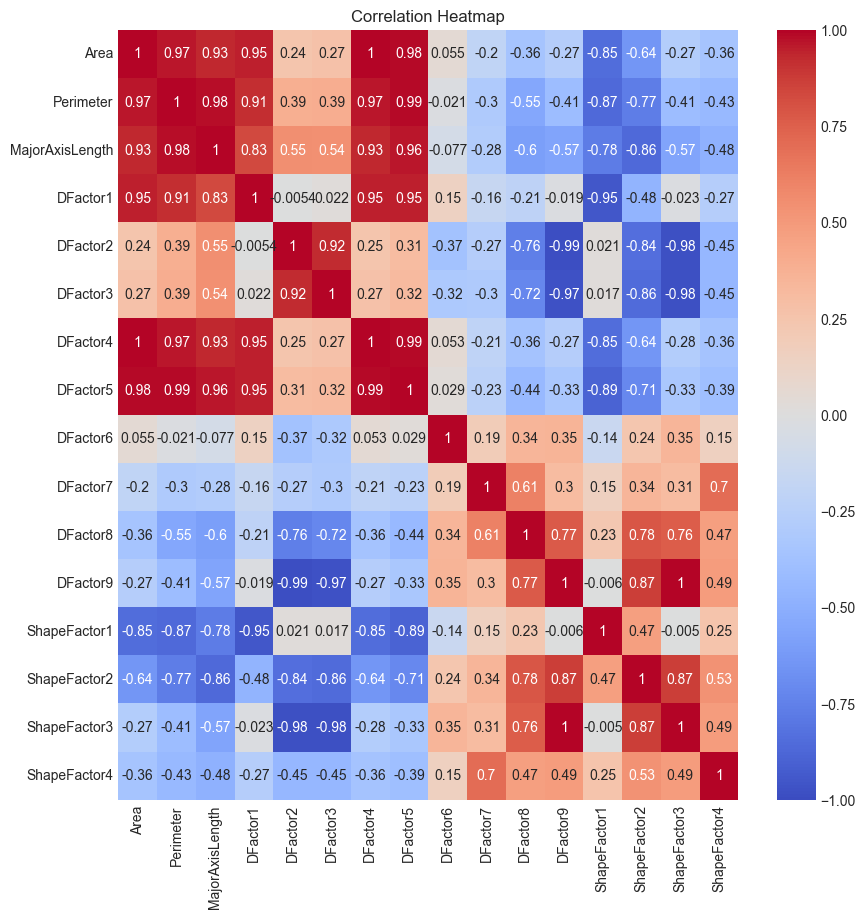

In [42]:
df1=df.copy()
# Drop the column 'Class'
df1.drop('Class', axis=1, inplace=True)

# Calculate the correlation matrix
corr = df1.corr()
plt.figure(figsize=(10, 10))
# Create the correlation heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)

plt.title('Correlation Heatmap')
plt.show()


##### 2. What is/are the insight(s) found from the chart?

Answer Here

there are many highly correalted columns 3 colums are like area and perimeter are 0.97 correlated 
MajorAxisLength and area 0.93 
DFactor1 and area 0.95

#### Chart - 15 - Pair Plot 

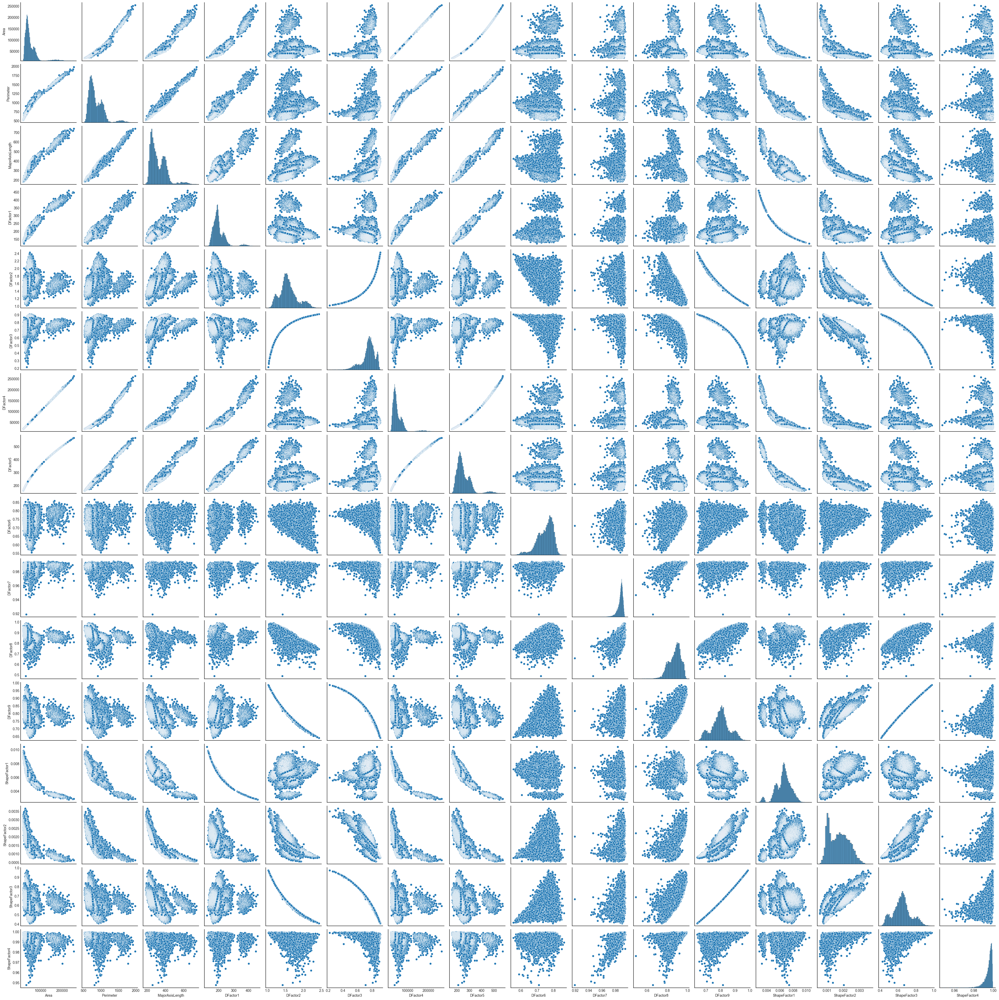

In [43]:
# Pair Plot visualization code
sns.pairplot(df)

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

#Handling Missing Values & Missing Value Imputation

there are no null values

### 2. Handling Outliers

In [44]:
# Handling Outliers & Outlier treatments

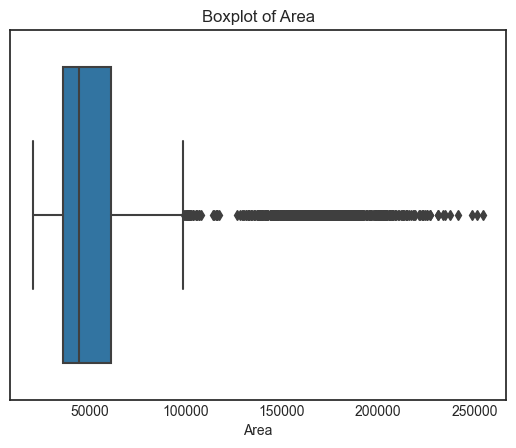

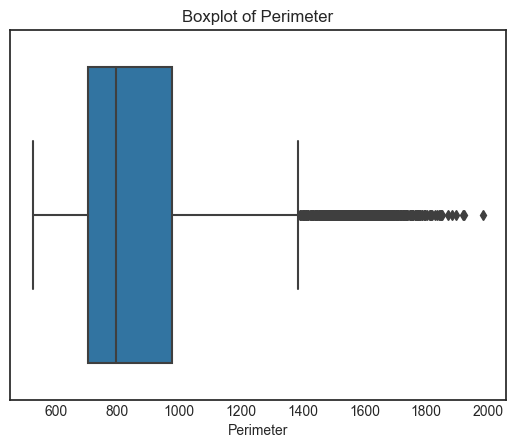

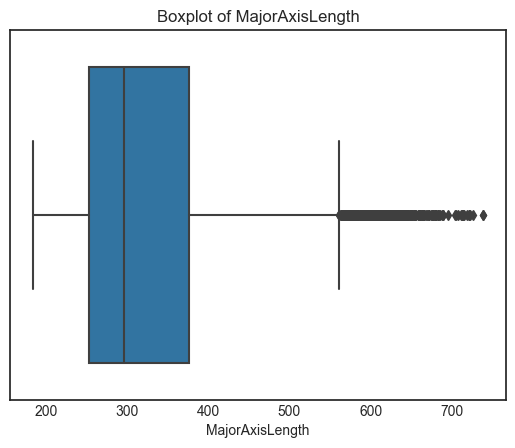

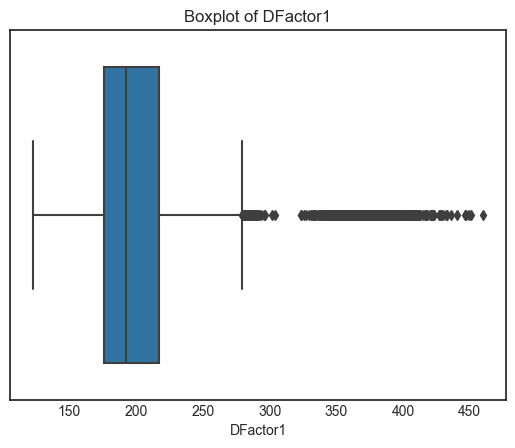

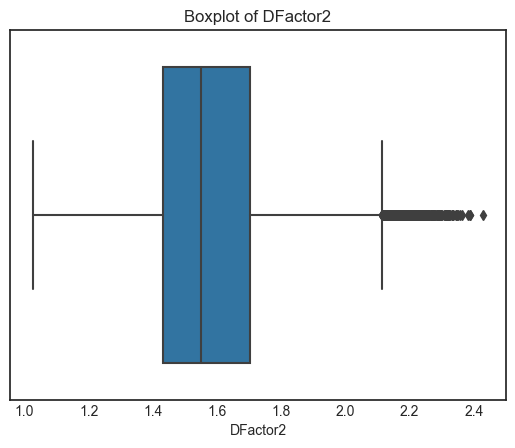

...

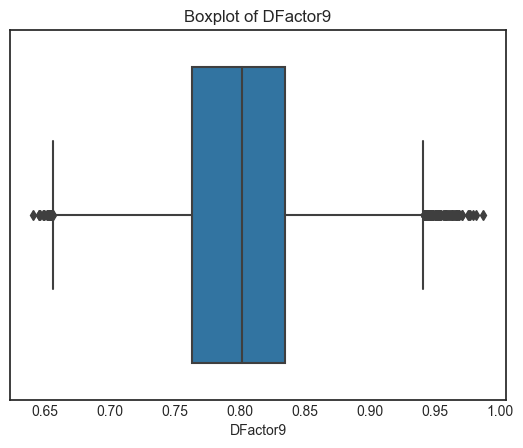

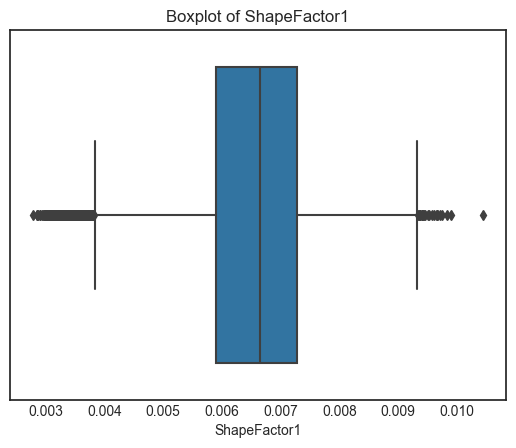

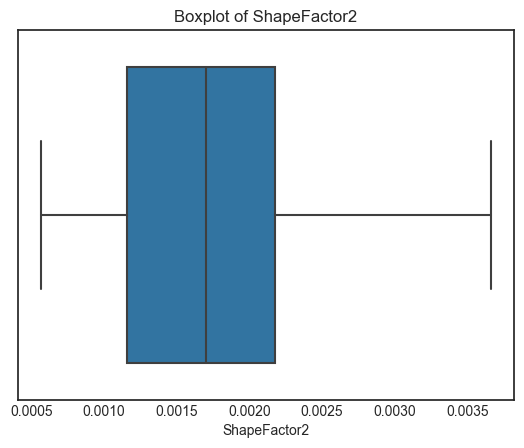

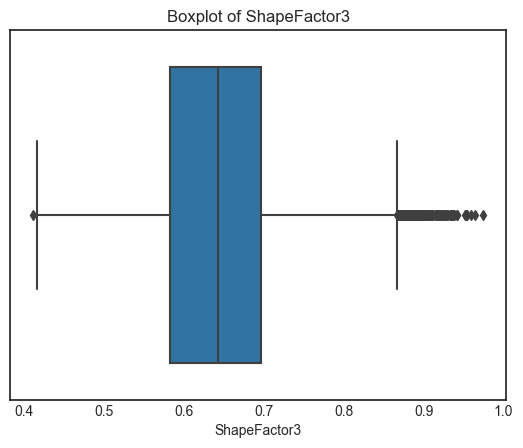

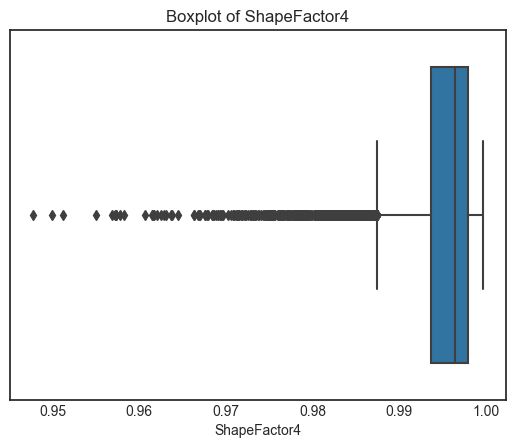

In [45]:
import seaborn as sns

for column in df.describe().columns:
    sns.boxplot(x=column, data=df)
    plt.title("Boxplot of " + column)
    plt.show()


In [46]:
df.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2',
       'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8',
       'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3',
       'ShapeFactor4', 'Class'],
      dtype='object')

In [47]:
import pandas as pd

# List of column names
columns = ['Area', 'Perimeter', 'MajorAxisLength', 'DFactor1', 'DFactor2',
       'DFactor3', 'DFactor4', 'DFactor5', 'DFactor6', 'DFactor7', 'DFactor8',
       'DFactor9', 'ShapeFactor1', 'ShapeFactor2', 'ShapeFactor3',
       'ShapeFactor4'
]

# Capping function using percentiles
def cap_outliers(df, column):
    upper_lim = df[column].quantile(0.85)
    lower_lim = df[column].quantile(0.10)
    df.loc[df[column] > upper_lim, column] = upper_lim
    df.loc[df[column] < lower_lim, column] = lower_lim

# Loop through each column and cap outliers
for column in columns:
    cap_outliers(df, column)


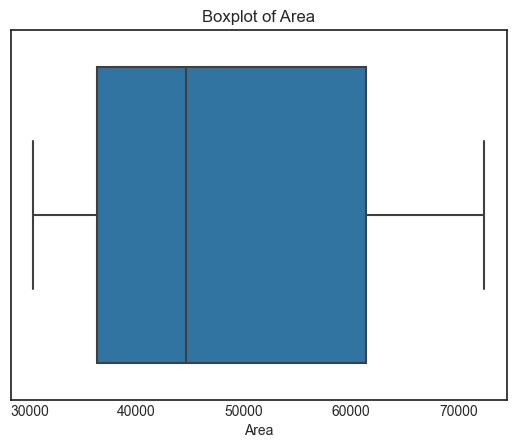

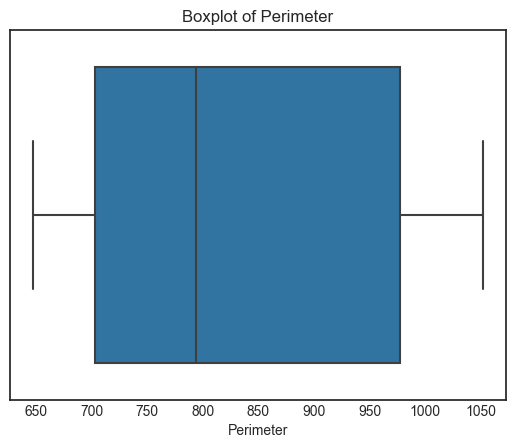

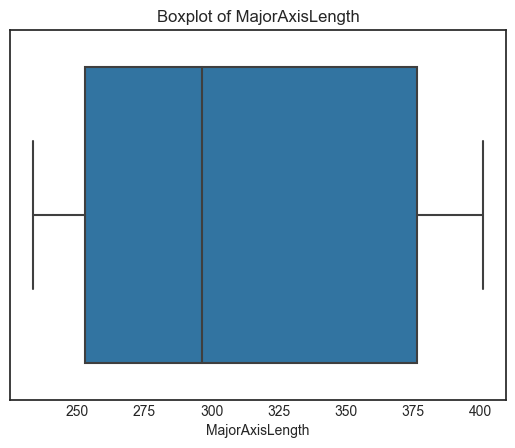

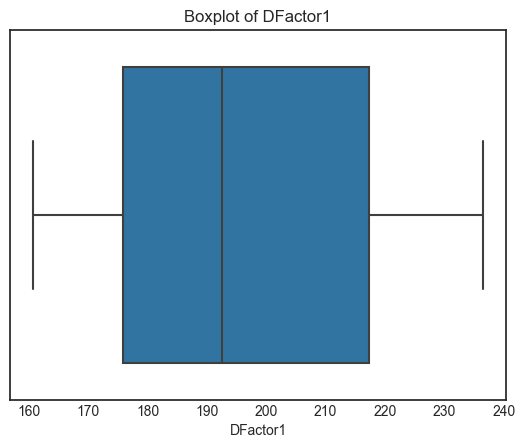

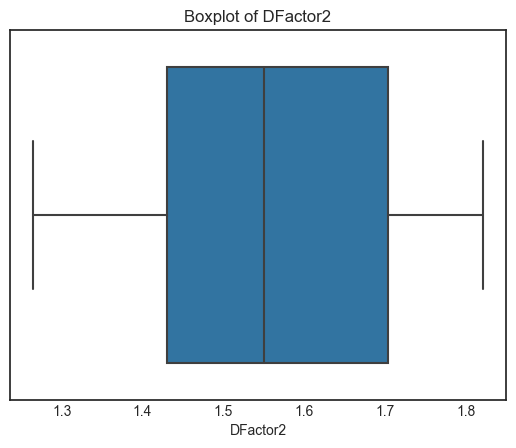

...

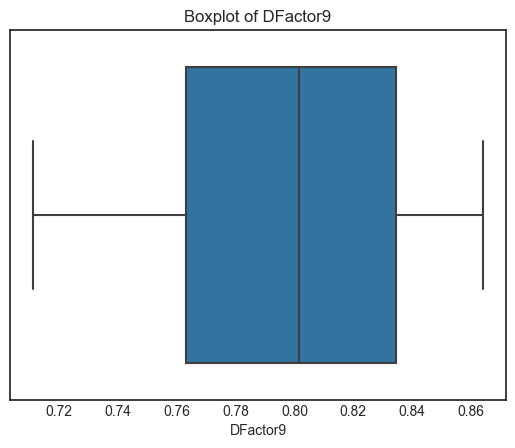

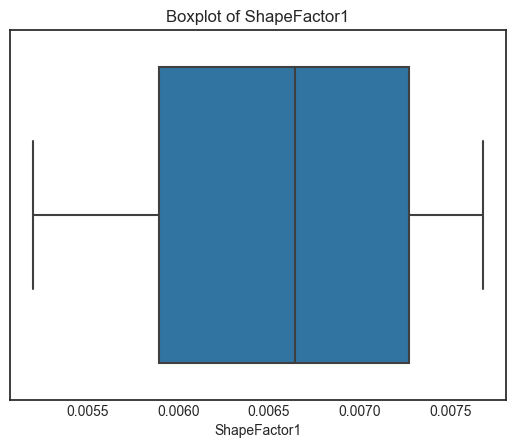

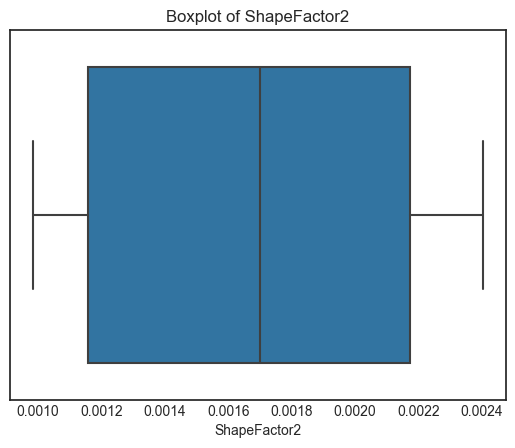

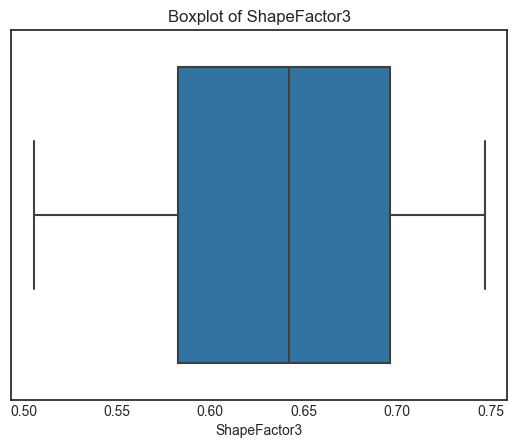

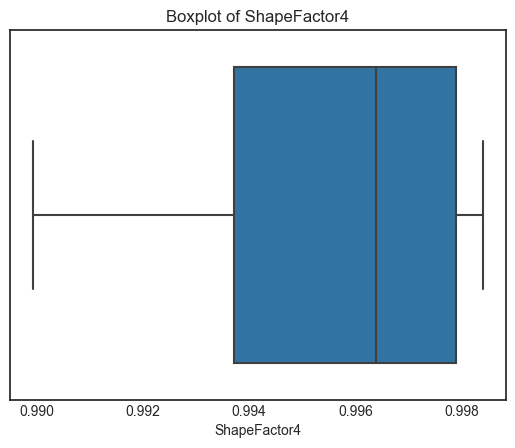

In [48]:
import seaborn as sns

for column in df.describe().columns:
    sns.boxplot(x=column, data=df)
    plt.title("Boxplot of " + column)
    plt.show()


##### What all outlier treatment techniques have you used and why did you use those techniques?

Answer Here.


a function called cap_outliers() that caps outliers in a DataFrame using percentiles.

The function takes two arguments:

df: The DataFrame containing the data.
column: The name of the column in the DataFrame to cap outliers.
The function first calculates the 85th and 10th percentiles of the column. These values are then used to define the upper and lower limits for the column. Any values in the column that are greater than the upper limit are capped to the upper limit. Any values in the column that are less than the lower limit are capped to the lower limit.

The function then loops through each column in the DataFrame and calls the cap_outliers() function on each column. This ensures that all of the columns in the DataFrame have their outliers capped.

### 3. Categorical Encoding

In [49]:
# Encode your categorical columns

In [50]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
le = LabelEncoder()

# Label encode the `df['Class']` column
df['Class'] = le.fit_transform(df['Class'])


#### What all categorical encoding techniques have you used & why did you use those techniques?

Answer Here.


Since the Class column in your dataframe contains a list of unique string values, I  used label encoding.

Label encoding is a type of encoding that converts categorical variables into numerical variables by assigning a unique integer to each category. This makes it easier for machine learning algorithms to process the data and learn from it.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [51]:
# Transform Your data

In [52]:
import pandas as pd
from scipy import stats

# Create a copy of the DataFrame to store the transformed values
df_transformed = df.copy()

# Iterate over each column in the DataFrame
for column in df.columns:
    # Get the column data
    column_data = df[column]
    
    # Check if the column is constant
    if column_data.nunique() > 1:
        # Check if all values in the column are positive
        if column_data.min() > 0:
            # Perform Box-Cox transformation on the column data
            transformed_data, lambda_ = stats.boxcox(column_data)
            
            # Store the transformed values in the new DataFrame
            df_transformed[column] = transformed_data

# Print the transformed DataFrame
#print(df_transformed)


performing box cox transformation on the dataset

In [53]:
# first seeing the the columns that are 90% correlated and then dropping it

### 6. Data Scaling

In [54]:
# Scaling your data

#for data scaling I used standard scaler

In [55]:
# to obtain the mutual information values
from sklearn.feature_selection import mutual_info_classif
# to select the features
from sklearn.feature_selection import SelectKBest

In [56]:
X = df_transformed.drop('Class',axis=1)  # dataframe
y = df_transformed['Class']              # series
print(type(X))
print(type(y))
print(X.shape,y.shape)

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.series.Series'>
(13543, 16) (13543,)


In [57]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.30)

In [58]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

In [59]:
# I used standard scaler to scale to data to a common range

In [60]:
X_train_scaled.shape

(9480, 16)

# pca 

two main reasons for doing  principal component analysis (PCA):

Dimensionality reduction: PCA can be used to reduce the number of dimensions in a dataset. This can be useful for a number of reasons, such as:

Reducing the computational cost of training and predicting with machine learning models.
Making the data easier to visualize.
Reducing the amount of noise in the data.
Feature extraction: PCA can be used to extract features from a dataset. These features can be used to improve the performance of machine learning models.

In [61]:
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris


# Apply PCA to the training data
pca = PCA(n_components=10)
X_train_pca = pca.fit_transform(X_train_scaled)

# Apply PCA to the test data
X_test_pca = pca.transform(X_test_scaled)



In [62]:
X_test_pca.shape

(4063, 10)

In [63]:
variance_explained = pca.explained_variance_ratio_.sum()
variance_explained

0.999670798552078

In [64]:
# Get the explained variance ratio
explained_variance = pca.explained_variance_ratio_

# Calculate the cumulative explained variance
cumulative_variance = explained_variance.cumsum()

In [65]:
explained_variance

array([6.31220841e-01, 2.08695532e-01, 6.60270937e-02, 5.19312024e-02,
       2.69023920e-02, 8.15494568e-03, 4.59709266e-03, 1.15309702e-03,
       8.09147753e-04, 1.79453685e-04])

In [66]:
cumulative_variance

array([0.63122084, 0.83991637, 0.90594347, 0.95787467, 0.98477706,
       0.99293201, 0.9975291 , 0.9986822 , 0.99949134, 0.9996708 ])

In [67]:
#seeing how much data is extracted from the number of columns in pca taken

In [68]:
round(sum(list(pca.explained_variance_ratio_))*100, 2)

99.97

## ***7. ML Model Implementation***

### ML Model - 1

In [69]:
# ML Model - 1 Implementation

# Fit the Algorithm

# Predict on the model

In [70]:
def Visualize_confusion_matrix(y_test, y_pred):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(7, 5))
    sns.heatmap(cm, annot=True, fmt='g', cmap='Oranges',
                xticklabels=['DE','SI','SE','HO','CA','BA' ,'BO'], yticklabels=['DE','SI','SE','HO','CA','BA' ,'BO'])
    plt.title('Accuracy: {0:.4f}'.format(accuracy_score(y_test, y_pred)))
    plt.ylabel('True Values')
    plt.xlabel('Predicted Values')
    plt.show()
    
    print("\n")
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    return

# LogisticRegression

In [72]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score

# Fitting logistic regression on train data

In [73]:
from sklearn.linear_model import LogisticRegression

clf1 = LogisticRegression(random_state = 0,fit_intercept=True, max_iter=10000,multi_class='multinomial', solver='lbfgs')
clf1.fit(X_train_pca, y_train)

LogisticRegression(max_iter=10000, multi_class='multinomial', random_state=0)

# trianing model


In [74]:
y_pred=clf1.predict(X_test_pca)

In [75]:
# Train Score
train_score = clf1.score(X_train_pca, y_train)
print('Training Score: %0.4f'% train_score)

Training Score: 0.9181


In [76]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
print(confusion_matrix(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
print(classification_report(y_pred,y_test))

[[353   3  11   0   3   8   1]
 [  0 121   4   0   0   0   0]
 [ 20  20 445   0   7   0   0]
 [  0   0   0 985   4  11  69]
 [  1   0  10   1 522   0  17]
 [  2   0   0  18   0 577  14]
 [  5   0   1  72   9  20 729]]
0.9185331036180162
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       379
           1       0.84      0.97      0.90       125
           2       0.94      0.90      0.92       492
           3       0.92      0.92      0.92      1069
           4       0.96      0.95      0.95       551
           5       0.94      0.94      0.94       611
           6       0.88      0.87      0.88       836

    accuracy                           0.92      4063
   macro avg       0.91      0.93      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [77]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))


Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [78]:
print(X_train_pca.shape)


(9480, 10)


In [79]:
acc1 = accuracy_score(y_test, y_pred)

In [80]:
print("Accuracy:", acc1)

Accuracy: 0.9185331036180162


In [81]:
from sklearn.metrics import accuracy_score


# Calculate the accuracy score
acc1 = accuracy_score( y_pred,y_test)

print("Accuracy:", acc1)


Accuracy: 0.9185331036180162


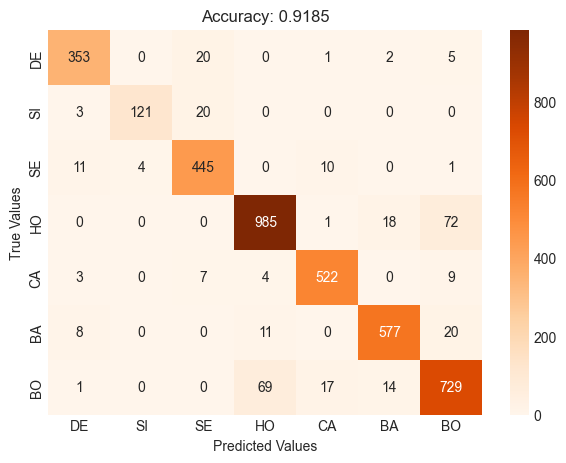



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [82]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

#### 2. Cross- Validation & Hyperparameter Tuning

In [84]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

In [85]:
## Hyperparameter Tuning
## GridSearch CV
from sklearn.model_selection import GridSearchCV
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# parameter grid
parameters = {
    'penalty' : ['l1','l2','elasticnet'], 
    'C'       : np.logspace(-3,3,7),
    'solver'  : ['newton-cg', 'sag', 'saga' ,'lbfgs'],
    #'random_state':  'RandomState instance',
    'multi_class' :['auto', 'ovr', 'multinomial'],
    #'verbose': 1,
    #'n_jobs':100,
}


In [86]:
logreg = LogisticRegression()
clf = GridSearchCV(logreg,                    # model
                   param_grid = parameters,   # hyperparameters
                   scoring='accuracy',        # metric for scoring
                   cv=10)                     # number of folds

clf.fit(X_train_pca,y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(),
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'multi_class': ['auto', 'ovr', 'multinomial'],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['newton-cg', 'sag', 'saga', 'lbfgs']},
             scoring='accuracy')

In [87]:
clf.best_params_

{'C': 100.0, 'multi_class': 'auto', 'penalty': 'l2', 'solver': 'newton-cg'}

In [88]:
conf_mat = confusion_matrix(y_test,y_pred)
conf_mat

array([[353,   0,  20,   0,   1,   2,   5],
       [  3, 121,  20,   0,   0,   0,   0],
       [ 11,   4, 445,   0,  10,   0,   1],
       [  0,   0,   0, 985,   1,  18,  72],
       [  3,   0,   7,   4, 522,   0,   9],
       [  8,   0,   0,  11,   0, 577,  20],
       [  1,   0,   0,  69,  17,  14, 729]], dtype=int64)

In [89]:
clf.best_score_

0.9193037974683543

In [141]:
from sklearn.linear_model import LogisticRegression

clf = LogisticRegression(
    C=100.0,
    multi_class='auto',
    penalty='l2',
    solver='newton-cg',
) 

# Train the model
clf.fit(X_train_pca, y_train)


LogisticRegression(C=100.0, solver='newton-cg')

In [142]:
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063

[[353   0  20   0   1   2   5]
 [  3 121  20   0   0   0   0]
 [ 11   4 445   0  10   0   1]
 [  0   0   0 985   1  18  72]
 [  3   0   7   4 522   0   9]
 [  8   0   0  11   0 577  20]
 [  1   0   0  69  17  14 729]]
0.9185331036180162


In [143]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))


Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [144]:
from sklearn.metrics import accuracy_score



# Calculate the accuracy score
acc2 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc2)


Accuracy: 0.9185331036180162


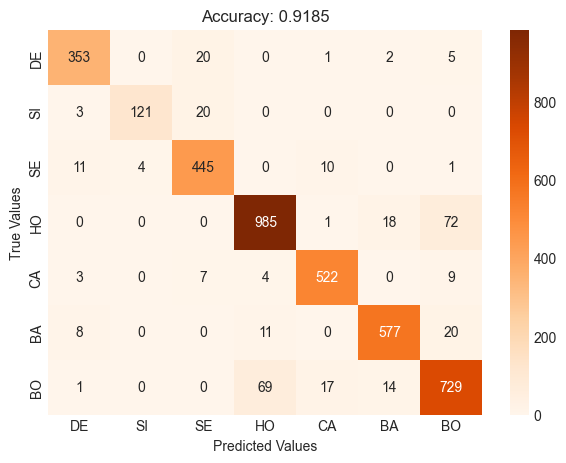



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [145]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

used grid search cv to hypertune the parameter with these parameters

{'C': 100.0, 'multi_class': 'auto', 'penalty': 'l2', 'solver': 'newton-cg'}


but no major change is there in accuracy 

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [96]:
# Visualizing evaluation Metric Score chart

# DecisionTreeClassifier

#### 2. Cross- Validation & Hyperparameter Tuning

In [97]:
parameter={
  'criterion':['gini','entropy','log_loss'],
  'splitter':['best','random'],
  'max_depth':[1,2,3,4,5,6,7,8,9],
  'max_features':['auto', 'sqrt', 'log2'],
  'max_leaf_nodes': [10, 20, 30, 40, 50],
  'min_impurity_decrease': [0.0, 0.01, 0.05, 0.1,0.2,0.3,0.4]
}


In [98]:
from sklearn.model_selection import GridSearchCV
classifier=DecisionTreeClassifier()

In [99]:
clf=GridSearchCV(classifier,param_grid=parameter,cv=10,scoring='accuracy',verbose=3)
clf.fit(X_train_pca,y_train)

Fitting 10 folds for each of 5670 candidates, totalling 56700 fits
[CV 1/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 2/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 3/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 4/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 5/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 6/10] END criterion=gini, max_depth=1, max_features=auto, max_leaf_nodes=10, min_impurity_decrease=0.0, splitter=best;, score=nan total time=   0.0s
[CV 7/10] END c

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'max_leaf_nodes': [10, 20, 30, 40, 50],
                         'min_impurity_decrease': [0.0, 0.01, 0.05, 0.1, 0.2,
                                                   0.3, 0.4],
                         'splitter': ['best', 'random']},
             scoring='accuracy', verbose=3)

In [100]:
clf.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'max_features': 'sqrt',
 'max_leaf_nodes': 50,
 'min_impurity_decrease': 0.0,
 'splitter': 'best'}

In [146]:
classifier = DecisionTreeClassifier(
    criterion='gini',
    max_depth=9,
    max_features='sqrt',
    max_leaf_nodes=50,
    min_impurity_decrease=0.0,
    splitter='best',
)


In [147]:
classifier.fit(X_train_pca,y_train)

DecisionTreeClassifier(max_depth=9, max_features='sqrt', max_leaf_nodes=50)

In [148]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
print(confusion_matrix(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
print(classification_report(y_pred,y_test))

[[353   3  11   0   3   8   1]
 [  0 121   4   0   0   0   0]
 [ 20  20 445   0   7   0   0]
 [  0   0   0 985   4  11  69]
 [  1   0  10   1 522   0  17]
 [  2   0   0  18   0 577  14]
 [  5   0   1  72   9  20 729]]
0.9185331036180162
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       379
           1       0.84      0.97      0.90       125
           2       0.94      0.90      0.92       492
           3       0.92      0.92      0.92      1069
           4       0.96      0.95      0.95       551
           5       0.94      0.94      0.94       611
           6       0.88      0.87      0.88       836

    accuracy                           0.92      4063
   macro avg       0.91      0.93      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [149]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))


Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [150]:
from sklearn.metrics import accuracy_score

# Make predictions on the test data
#y_pred = classifier.predict(X_test)

# Calculate the accuracy score
acc3 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc3)


Accuracy: 0.9185331036180162


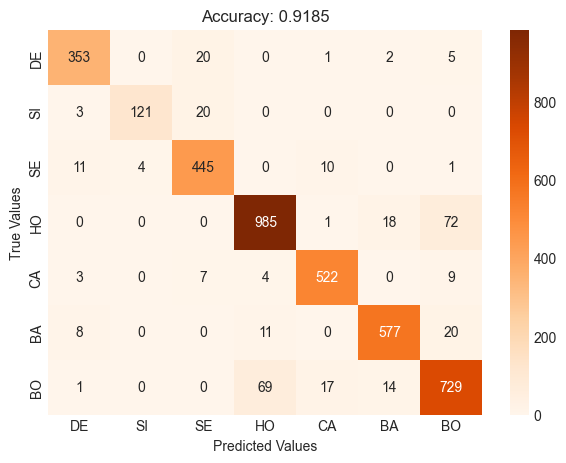



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [151]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

In [107]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?



Answer Here.




used grid search cv to hypertune the parameter with these parameters

{'criterion': 'gini',
 'max_depth': 9,
 'max_features': 'sqrt',
 'max_leaf_nodes': 50,
 'min_impurity_decrease': 0.0,
 'splitter': 'best'}


but no major change is there in accuracy 

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

### ML Model - 3

In [108]:
# ML Model - 3 Implementation

# Fit the Algorithm

# Predict on the model

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [109]:
# Visualizing evaluation Metric Score chart

# ANN

In [110]:
pip install tensorflow

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [111]:
from tensorflow import keras
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation,Dropout
from tensorflow.keras.callbacks import EarlyStopping

In [112]:
pip install --upgrade pip

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [113]:
import tensorflow as tf
# Define the model
model = tf.keras.Sequential([
  tf.keras.layers.Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
  tf.keras.layers.Dense(64, activation='relu'),
  tf.keras.layers.Dense(10, activation='softmax')
])

# Compile the model
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Define the early stopping callback
early_stopping = EarlyStopping(monitor='val_loss', patience=3)
# Train the model
#model.fit(X_train, y_train, epochs=100)
model.fit(X_train, y_train, epochs=100, callbacks=[early_stopping], validation_data=(X_test, y_test))
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test)

# Print the test accuracy
print('Test accuracy:', test_accuracy)


Epoch 1/100
297/297 [==============================] - 2s 4ms/step - loss: 1.7262 - accuracy: 0.3323 - val_loss: 1.3815 - val_accuracy: 0.5316
Epoch 2/100
297/297 [==============================] - 1s 3ms/step - loss: 1.2253 - accuracy: 0.5398 - val_loss: 1.1300 - val_accuracy: 0.5786
Epoch 3/100
297/297 [==============================] - 1s 3ms/step - loss: 1.1169 - accuracy: 0.5718 - val_loss: 1.1906 - val_accuracy: 0.5452
Epoch 4/100
297/297 [==============================] - 1s 3ms/step - loss: 1.0983 - accuracy: 0.5742 - val_loss: 1.0689 - val_accuracy: 0.5887
Epoch 5/100
297/297 [==============================] - 1s 3ms/step - loss: 1.0863 - accuracy: 0.5789 - val_loss: 1.0683 - val_accuracy: 0.5895
Epoch 6/100
297/297 [==============================] - 1s 3ms/step - loss: 1.0837 - accuracy: 0.5797 - val_loss: 1.0563 - val_accuracy: 0.5932
Epoch 7/100
297/297 [==============================] - 1s 3ms/step - loss: 1.0717 - accuracy: 0.5844 - val_loss: 1.0599 - val_accuracy: 0.5855

In [114]:
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
print(confusion_matrix(y_pred,y_test))
print(accuracy_score(y_pred,y_test))
print(classification_report(y_pred,y_test))

[[353   3  11   0   3   8   1]
 [  0 121   4   0   0   0   0]
 [ 20  20 445   0   7   0   0]
 [  0   0   0 985   4  11  69]
 [  1   0  10   1 522   0  17]
 [  2   0   0  18   0 577  14]
 [  5   0   1  72   9  20 729]]
0.9185331036180162
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       379
           1       0.84      0.97      0.90       125
           2       0.94      0.90      0.92       492
           3       0.92      0.92      0.92      1069
           4       0.96      0.95      0.95       551
           5       0.94      0.94      0.94       611
           6       0.88      0.87      0.88       836

    accuracy                           0.92      4063
   macro avg       0.91      0.93      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [115]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))


Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [116]:
from sklearn.metrics import accuracy_score

# Make predictions on the test data
#y_pred = gnb.predict(X_test)

# Calculate the accuracy score
acc4 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc4)


Accuracy: 0.9185331036180162


In [117]:
# Evaluate the model on the test data
test_loss, test_accuracy = model.evaluate(X_test, y_test)

# Print the test accuracy
print('Test accuracy:', test_accuracy)

127/127 [==============================] - 0s 2ms/step - loss: 0.8199 - accuracy: 0.6891
Test accuracy: 0.6891459226608276


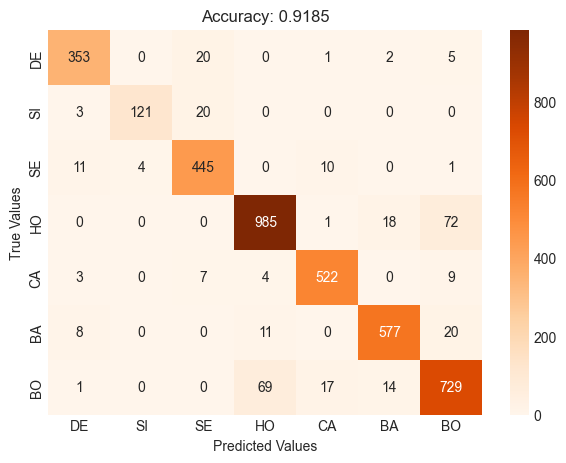



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [118]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

the accuracy of all models are same

# naive_bayes

In [119]:
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import cross_val_score
from sklearn.naive_bayes import MultinomialNB

In [120]:
gnb=GaussianNB()


In [121]:
gnb.fit(X_train_pca,y_train)

GaussianNB()

In [122]:
from sklearn.metrics import accuracy_score

# Make predictions on the test data
#y_pred = gnb.predict(X_test)

# Calculate the accuracy score
acc5 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc5)


Accuracy: 0.9185331036180162


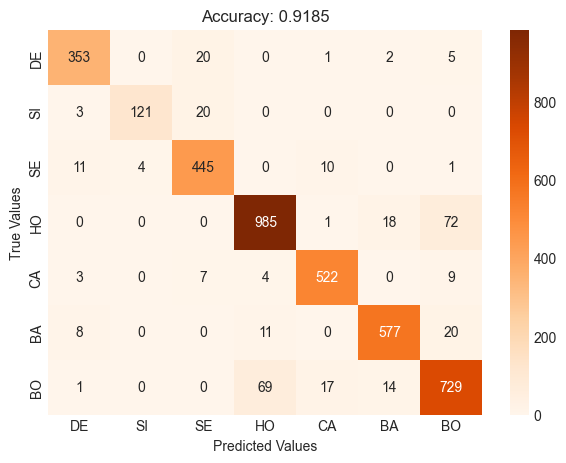



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [123]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

#### 2. Cross- Validation & Hyperparameter Tuning

In [124]:
from sklearn.model_selection import GridSearchCV

In [125]:

param_grid = {
    'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5],
    
}

# Create a GridSearchCV instance
grid = GridSearchCV(estimator=gnb, param_grid=param_grid, cv=10, scoring='accuracy')

# Fit the model to the data
grid.fit(X_train, y_train)

# Get the best parameters and the best score
best_params = grid.best_params_
best_score = grid.best_score_

print("Best Parameters: ", best_params)
print("Best Score: ", best_score)

# Use the best model for prediction
best_model = grid.best_estimator_
test_accuracy = best_model.score(X_test, y_test)

print('Test accuracy:', test_accuracy)

Best Parameters:  {'var_smoothing': 1e-05}
Best Score:  0.8728902953586498
Test accuracy: 0.866847157272951


In [126]:
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063

[[353   0  20   0   1   2   5]
 [  3 121  20   0   0   0   0]
 [ 11   4 445   0  10   0   1]
 [  0   0   0 985   1  18  72]
 [  3   0   7   4 522   0   9]
 [  8   0   0  11   0 577  20]
 [  1   0   0  69  17  14 729]]
0.9185331036180162


In [127]:
grid.best_params_

{'var_smoothing': 1e-05}

In [128]:
from sklearn.naive_bayes import GaussianNB

gnb1 = GaussianNB(var_smoothing=1e-05)


In [129]:
gnb1.fit(X_train_pca,y_train)

GaussianNB(var_smoothing=1e-05)

In [130]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))

Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [131]:
from sklearn.metrics import accuracy_score

# Make predictions on the test data
#y_pred = gnb1.predict(X_test)

# Calculate the accuracy score
acc5 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc5)


Accuracy: 0.9185331036180162


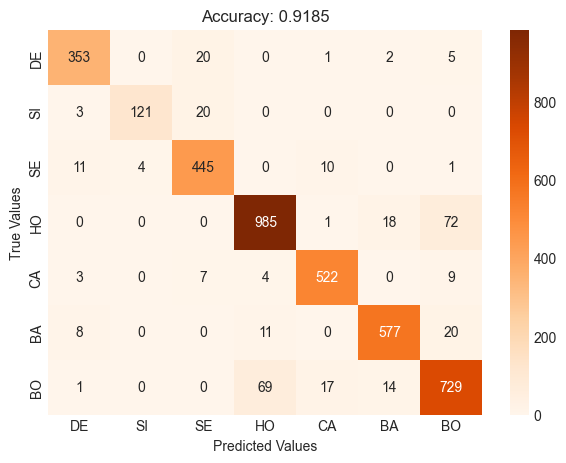



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [132]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

# svc 

In [133]:
from sklearn.svm import SVC

In [134]:
svc=SVC(kernel='linear')

In [135]:
svc.fit(X_train_pca,y_train)

SVC(kernel='linear')

In [136]:
print('Recall score (macro): %0.4f' % recall_score(y_test, y_pred, average='macro'))
print('Precision score (macro): %0.4f' % precision_score(y_test, y_pred, average='macro'))
print('F1-Score (macro): %0.4f' % f1_score(y_test, y_pred, average='macro'))
print('Accuracy score: %0.4f' % accuracy_score(y_test, y_pred))

Recall score (macro): 0.9143
Precision score (macro): 0.9270
F1-Score (macro): 0.9199
Accuracy score: 0.9185


In [137]:
print(classification_report(y_test,y_pred))
print(confusion_matrix(y_test,y_pred))
print(accuracy_score(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063

[[353   0  20   0   1   2   5]
 [  3 121  20   0   0   0   0]
 [ 11   4 445   0  10   0   1]
 [  0   0   0 985   1  18  72]
 [  3   0   7   4 522   0   9]
 [  8   0   0  11   0 577  20]
 [  1   0   0  69  17  14 729]]
0.9185331036180162


In [138]:
from sklearn.metrics import accuracy_score

# Make predictions on the test data
#y_pred = svc.predict(X_test)

# Calculate the accuracy score
acc6 = accuracy_score(y_test, y_pred)

print("Accuracy:", acc6)


Accuracy: 0.9185331036180162


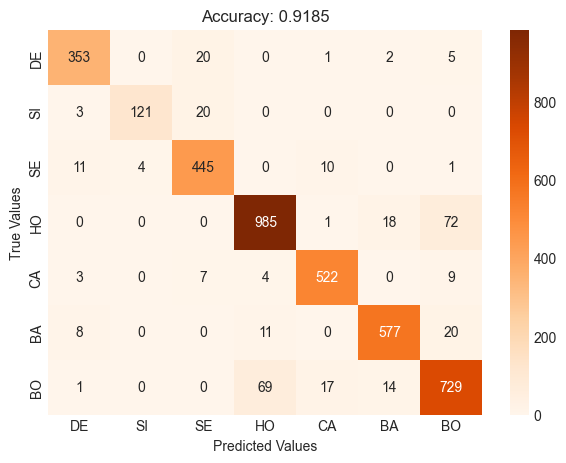



Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.93      0.93       381
           1       0.97      0.84      0.90       144
           2       0.90      0.94      0.92       471
           3       0.92      0.92      0.92      1076
           4       0.95      0.96      0.95       545
           5       0.94      0.94      0.94       616
           6       0.87      0.88      0.88       830

    accuracy                           0.92      4063
   macro avg       0.93      0.91      0.92      4063
weighted avg       0.92      0.92      0.92      4063



In [139]:
# Test Predictions
Visualize_confusion_matrix(y_test, y_pred)

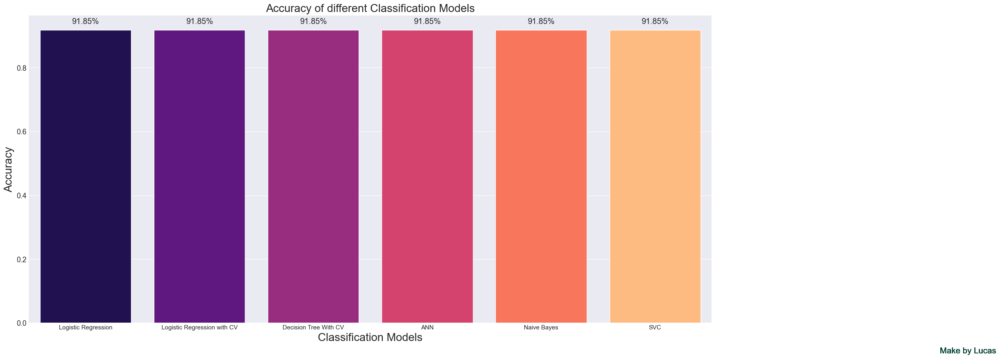

In [152]:
mylist=[]
mylist2=[]

mylist.append(acc1)
mylist2.append("Logistic Regression")
mylist.append(acc2)
mylist2.append("Logistic Regression with CV")

mylist.append(acc3)
mylist2.append("Decision Tree With CV")

mylist.append(acc4)
mylist2.append("ANN")
 
mylist.append(acc5)
mylist2.append("Naive Bayes")

mylist.append(acc6)
mylist2.append("SVC")

#mylist.append(acc7)
#mylist2.append("SVC_with_cv")
#mylist.append(acc3)
#mylist2.append("KNN")
#mylist.append(acc5)
#mylist2.append("Random Forest")
#mylist.append(acc7)
#mylist2.append("XG Boost")
#mylist.append(acc8)
#mylist2.append("Cat Boost")


plt.figure(figsize=(22, 10))
sns.set_style("darkgrid")
ax = sns.barplot(x = mylist2, y = mylist, palette = "magma", saturation =1.5)
plt.xlabel("Classification Models", fontsize = 20 )
plt.ylabel("Accuracy", fontsize = 20)
plt.title("Accuracy of different Classification Models", fontsize = 20)
plt.xticks(fontsize = 11, horizontalalignment = 'center', rotation = 0)
plt.yticks(fontsize = 13)
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.annotate(f'{height:.2%}', (x + width/2, y + height*1.02), ha='center', fontsize = 'x-large')

    # Add Text watermark
    plt.text(7.5, -0.1, 'Make by Lucas', fontsize = 15,
             color ='#034235', ha ='left', va ='bottom',
             alpha = 0.7)
       
plt.show();

In [ ]:
#  all models performance are almost similar for me I will go with ANN model